# To do list

- Datos faltantes
- Responder a la pregunta: ¿Está balanceado el dataset? ¿Por qué cree que hacemos esta pregunta?
- Hacer la validación cruzada train - test
- Punto 4 entero


# Integrantes

Moresco Brisa

Britos Julián Francisco

# Librerías

In [1]:
# !pip install pandas
# !pip install seaborn
# !pip install -U scikit-learn
# !pip install numpy

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
import numpy as np

# Carga de datos

In [3]:
# Carga datos de dataset
# Contiene aproximadamente 10 años de observaciones diarias de variables climáticas: temperatura, dirección y velocidad del viento, humedad, presión, nubosidad, y cantidad de lluvia en mm.
# tras observar los datos del día de hoy, el objetivo es predecir las variables target:
#                                                                                     -RainFallTomorrow: cantidad de lluvia del día posterior a la observación. Problema de Regresión.
#                                                                                     -RainTomorrow: si el día siguiente llueve o no llueve. Problema de Clasificación.
file_path= 'weatherAUS.csv'
weather_data = pd.read_csv(file_path, sep=',',engine='python')

# Visualización de datos

In [4]:
# Vista de datos
weather_data.head()

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2


In [5]:
# Columnas
weather_data.columns

Index(['Unnamed: 0', 'Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall',
       'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'RainfallTomorrow'],
      dtype='object')

In [6]:
# Tipos de variables
weather_data.dtypes

Unnamed: 0            int64
Date                 object
Location             object
MinTemp             float64
MaxTemp             float64
Rainfall            float64
Evaporation         float64
Sunshine            float64
WindGustDir          object
WindGustSpeed       float64
WindDir9am           object
WindDir3pm           object
WindSpeed9am        float64
WindSpeed3pm        float64
Humidity9am         float64
Humidity3pm         float64
Pressure9am         float64
Pressure3pm         float64
Cloud9am            float64
Cloud3pm            float64
Temp9am             float64
Temp3pm             float64
RainToday            object
RainTomorrow         object
RainfallTomorrow    float64
dtype: object

In [7]:
# Estadísticas descriptivas
weather_data.describe(include='all')

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
count,145412.000000,145412,145412,143928.000000,144159.000000,142152.000000,82658.000000,75616.000000,135096,135159.000000,...,140907.000000,130351.000000,130388.000000,89542.000000,86076.000000,143646.000000,141805.000000,142152,142153,142153.000000
unique,NaN,3435,49,NaN,NaN,NaN,NaN,NaN,16,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2,NaN
top,NaN,2013-11-11,Canberra,NaN,NaN,NaN,NaN,NaN,W,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,No,NaN
freq,NaN,49,3435,NaN,NaN,NaN,NaN,NaN,9910,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,110276,110281,NaN
mean,72728.184393,NaN,NaN,12.195873,23.223176,2.361516,5.468616,7.611241,NaN,40.036564,...,51.537432,1017.649277,1015.255184,4.447287,4.509770,16.992780,21.685249,NaN,NaN,2.361242
std,41990.722236,NaN,NaN,6.398018,7.118770,8.479338,4.193871,3.785612,NaN,13.607212,...,20.796720,7.107132,7.037981,2.887161,2.720306,6.488045,6.936358,NaN,NaN,8.479084
min,0.000000,NaN,NaN,-8.500000,-4.800000,0.000000,0.000000,0.000000,NaN,6.000000,...,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,NaN,NaN,0.000000
25%,36362.750000,NaN,NaN,7.600000,17.900000,0.000000,2.600000,4.800000,NaN,31.000000,...,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,NaN,NaN,0.000000
50%,72727.500000,NaN,NaN,12.000000,22.600000,0.000000,4.800000,8.400000,NaN,39.000000,...,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,NaN,NaN,0.000000
75%,109093.250000,NaN,NaN,16.900000,28.200000,0.800000,7.400000,10.600000,NaN,48.000000,...,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,NaN,NaN,0.800000


In [8]:
# Cantidad de valores faltantes.
weather_data.isna().sum()

Unnamed: 0              0
Date                    0
Location                0
MinTemp              1484
MaxTemp              1253
Rainfall             3260
Evaporation         62754
Sunshine            69796
WindGustDir         10316
WindGustSpeed       10253
WindDir9am          10562
WindDir3pm           4226
WindSpeed9am         1767
WindSpeed3pm         3061
Humidity9am          2653
Humidity3pm          4505
Pressure9am         15061
Pressure3pm         15024
Cloud9am            55870
Cloud3pm            59336
Temp9am              1766
Temp3pm              3607
RainToday            3260
RainTomorrow         3259
RainfallTomorrow     3259
dtype: int64

# Datos faltantes

Eliminamos todas las filas donde todas sus columnas sean NaN 

In [9]:
weather_data

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


In [10]:
weather_data = weather_data.dropna(how='all')

In [11]:
weather_data

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


Comparando la cantidad de filas antes y después de borrar todas las filas que contengan nulos en todas sus columnas, podemos sabes cuantas filas fueron borradas y, por lo tanto, cuantas filas NaN existían.

145412 rows - 145412 rows = 0 rows

Vemos como no había ninguna fila que tenga todas sus columnas con datos faltantes.

In [12]:
# Cantidad de valores faltantes.
weather_data.isna().sum()

Unnamed: 0              0
Date                    0
Location                0
MinTemp              1484
MaxTemp              1253
Rainfall             3260
Evaporation         62754
Sunshine            69796
WindGustDir         10316
WindGustSpeed       10253
WindDir9am          10562
WindDir3pm           4226
WindSpeed9am         1767
WindSpeed3pm         3061
Humidity9am          2653
Humidity3pm          4505
Pressure9am         15061
Pressure3pm         15024
Cloud9am            55870
Cloud3pm            59336
Temp9am              1766
Temp3pm              3607
RainToday            3260
RainTomorrow         3259
RainfallTomorrow     3259
dtype: int64

In [13]:
# Calcular la moda de cada columna
moda = weather_data.mode().iloc[0]

# Reemplazar los valores nulos con la moda
weather_data = weather_data.fillna(moda)

In [14]:
# Cantidad de valores faltantes.
weather_data.isna().sum()

Unnamed: 0          0
Date                0
Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir         0
WindGustSpeed       0
WindDir9am          0
WindDir3pm          0
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
RainfallTomorrow    0
dtype: int64

# Outliers

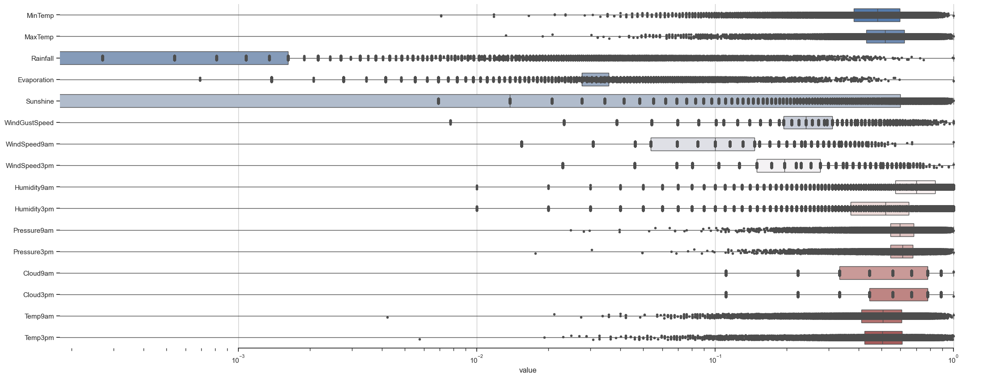

In [15]:
# Initialize a scaler
scaler = MinMaxScaler()

# Fit the scaler to the dataframe and transform the dataframe
weather_data_normalized = pd.DataFrame(scaler.fit_transform(weather_data.drop(columns=['Unnamed: 0', 'Date', 'Location', 
                                'WindGustDir', 'WindDir9am', 'WindDir3pm', 
                                'RainToday', 'RainTomorrow', 'RainfallTomorrow'])), columns=weather_data.drop(columns=['Unnamed: 0','Date' , 'Location', 
                                'WindGustDir', 'WindDir9am', 'WindDir3pm', 
                                'RainToday', 'RainTomorrow', 'RainfallTomorrow']).columns)

# Create a new DataFrame where each row is a variable and each column is an observation
weather_data__melted = weather_data_normalized.melt()

sns.set_theme(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(27, 10))
ax.set_xscale("log")

# Plot the orbital period with horizontal boxes
sns.boxplot(
    weather_data__melted, x="value", y="variable", hue="variable",
    whis=[0, 100], width=.6, palette="vlag"
)

# Add in points to show each observation
sns.stripplot(weather_data__melted, x="value", y="variable", size=4, color=".3")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

Vemos como pareciera haber datos atipicos en las columnas MinTemp, MaxTemp, Evaporation, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Pressure9am, Pressure3pm, Temp9am y Temp3pm. Ademas vemos en Rainfall que no hay boxplot. 

SIn embargo al ver un poco mas de cerca los datos como por ejemplo MinTemp ocurre lo sigueinte:

## Graficos de Outliers

In [16]:
# Nos aseguramos que Date este en formato tiempo 
weather_data['Date'] = pd.to_datetime(weather_data['Date'])

##### MinTemp

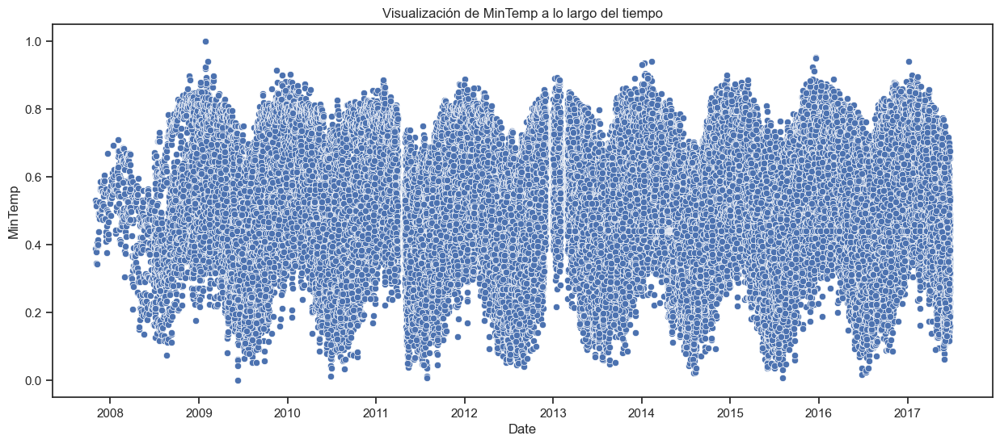

In [17]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['MinTemp']) 
plt.title('Visualización de MinTemp a lo largo del tiempo')
plt.show()

Vemos como no hay realmente datos atípicos y además podemos observar líneas rectas de datos faltantes en varios lugares.

Sabiendo este tendremos que corroborar uno por uno de las columnas mencionadas anteriormente donde pareciera haber outliers para asegurarnos de que sea así y no pase como en MinTemp donde hay falsos outliers

##### MaxTemp

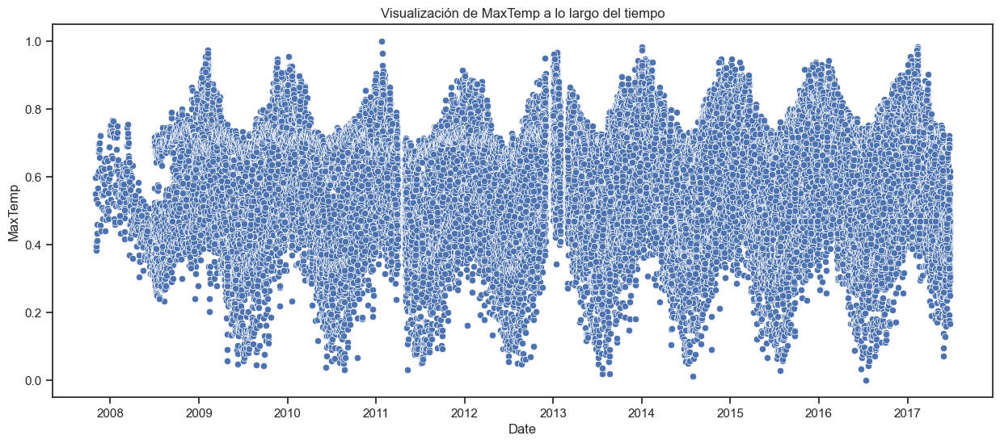

In [18]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['MaxTemp'])
plt.title('Visualización de MaxTemp a lo largo del tiempo')
plt.show()

Vemos que aligual que en MinTemp son falsos outliers

##### Rainfall

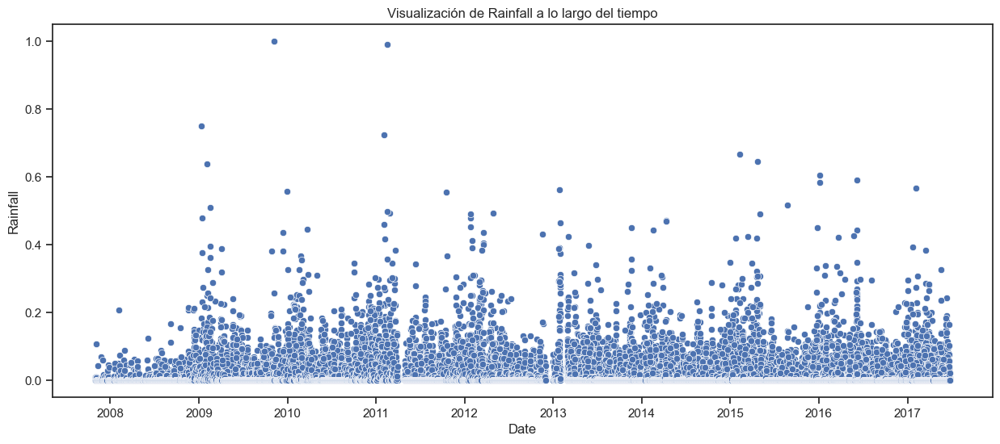

In [19]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Rainfall'])
plt.title('Visualización de Rainfall a lo largo del tiempo')
plt.show()

Vemos como Rainfall si tiene outlier 


##### Evaporation

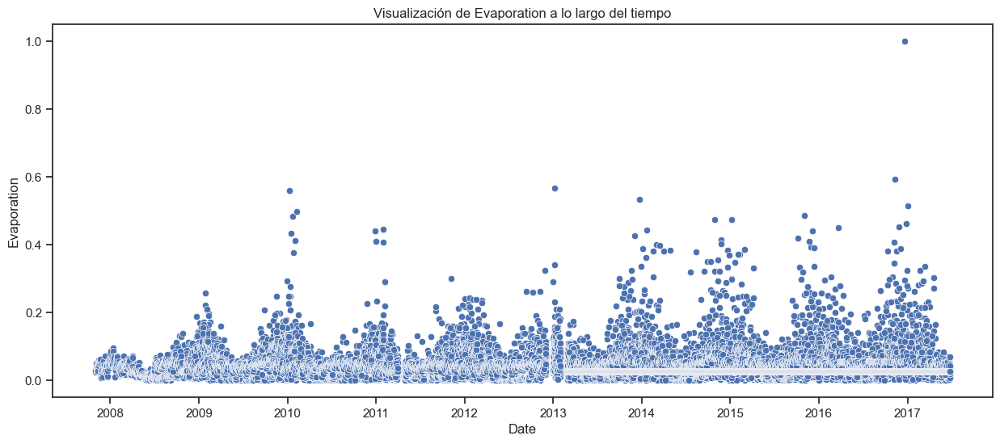

In [20]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Evaporation'])
plt.title('Visualización de Evaporation a lo largo del tiempo')
plt.show()

Vemos como solo tiene un outlier

##### Sunshine

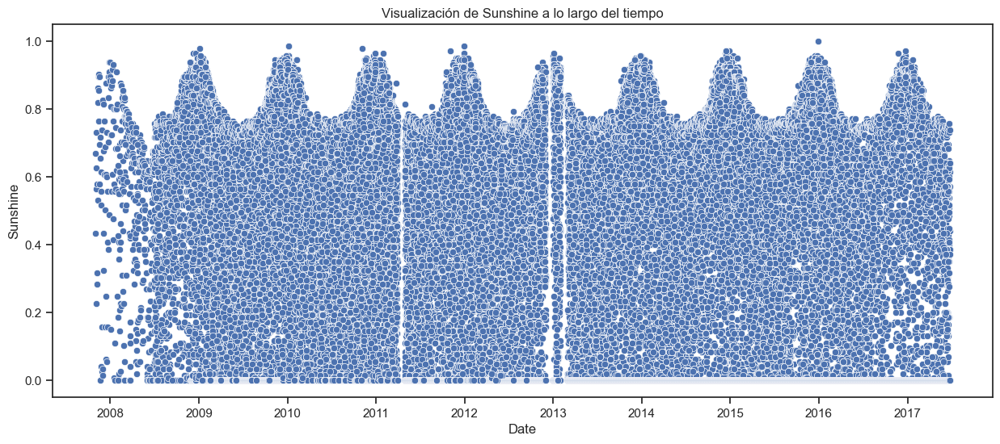

In [21]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Sunshine'] )
plt.title('Visualización de Sunshine a lo largo del tiempo')
plt.show()

Vemos como no tiene un outlier

##### WindGustSpeed

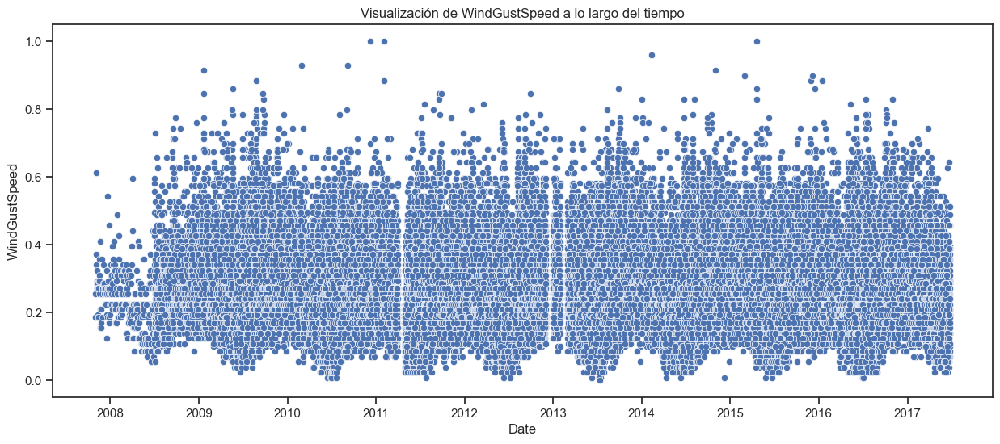

In [22]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['WindGustSpeed'])
plt.title('Visualización de WindGustSpeed a lo largo del tiempo')
plt.show()

No tiene outliers

##### WindSpeed9am

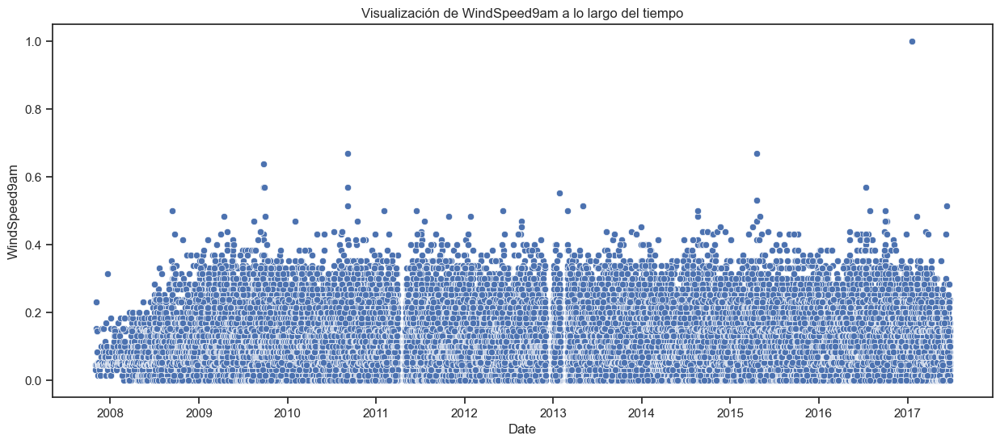

In [23]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['WindSpeed9am'])
plt.title('Visualización de WindSpeed9am a lo largo del tiempo')
plt.show()

Vemos como solo tiene un outlier

##### WindSpeed3pm

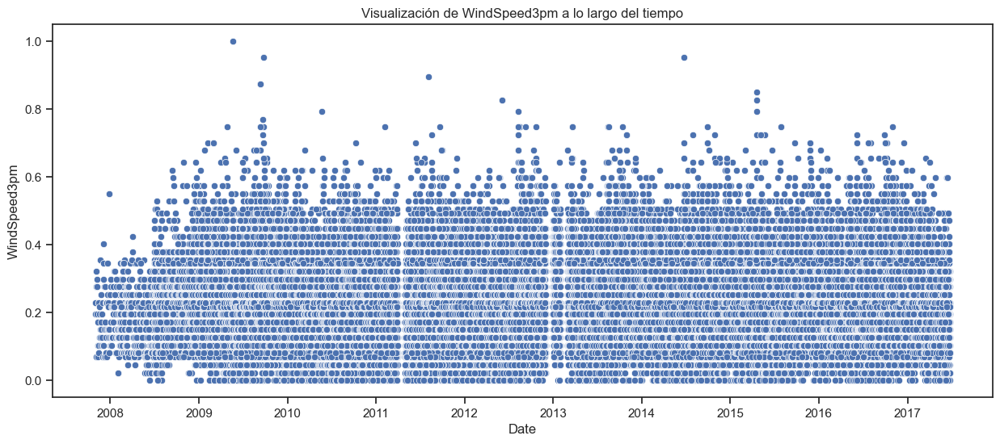

In [24]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['WindSpeed3pm'])
plt.title('Visualización de WindSpeed3pm a lo largo del tiempo')
plt.show()

No tiene outliers

##### Humidity9am

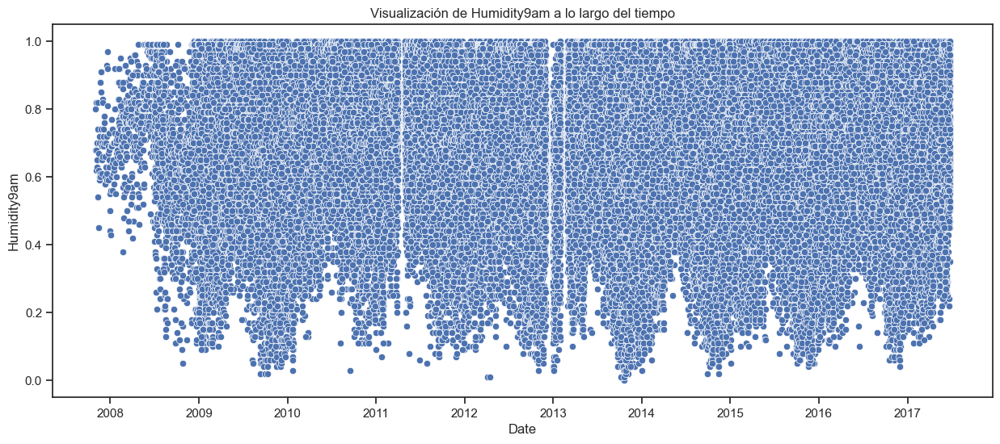

In [25]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Humidity9am'])
plt.title('Visualización de Humidity9am a lo largo del tiempo')
plt.show()

No tiene outliers

##### Humidity3pm

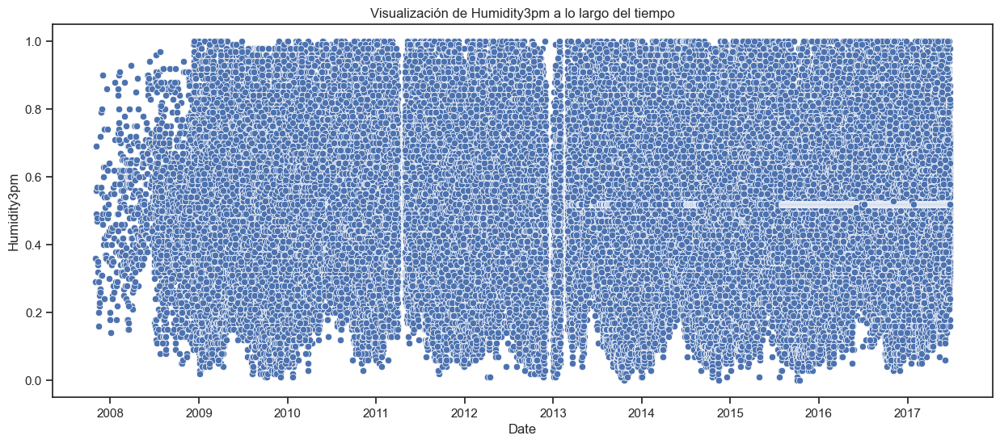

In [26]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Humidity3pm'])
plt.title('Visualización de Humidity3pm a lo largo del tiempo')
plt.show()

No tiene outliers

##### Pressure9am

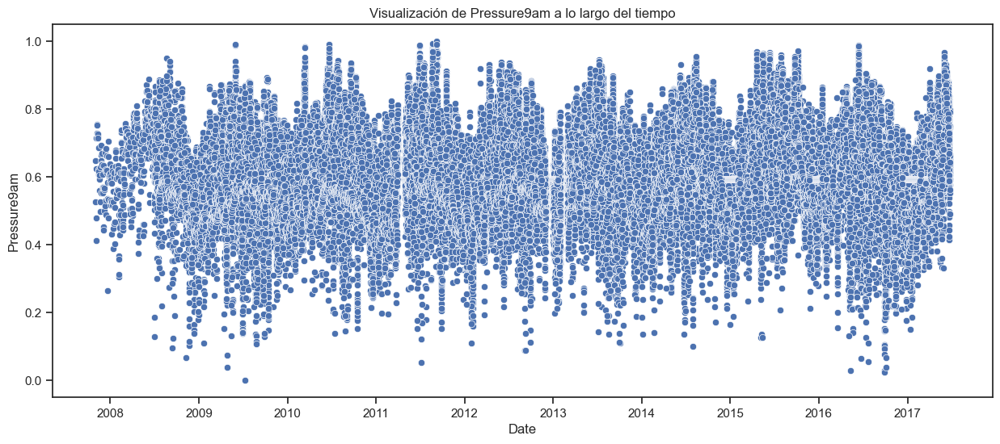

In [27]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Pressure9am'])
plt.title('Visualización de Pressure9am a lo largo del tiempo')
plt.show()

No tiene outliers

##### Pressure3pm

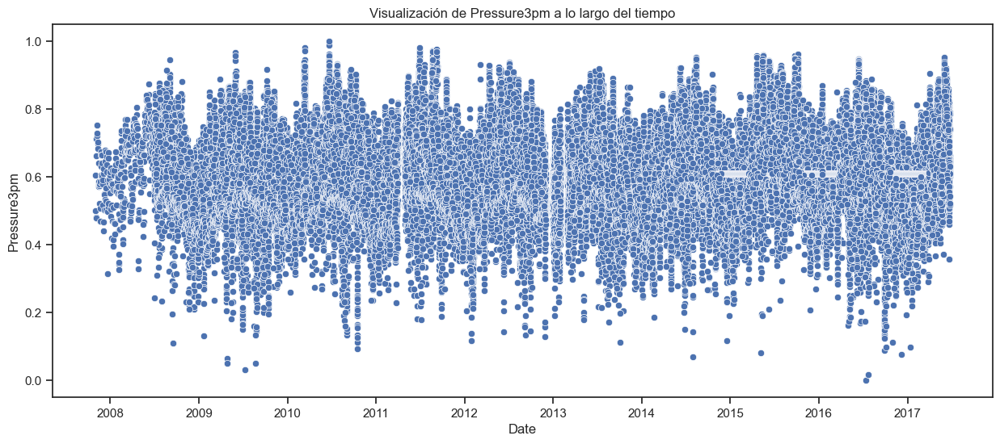

In [28]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Pressure3pm'])
plt.title('Visualización de Pressure3pm a lo largo del tiempo')
plt.show()

No tiene outliers

##### Cloud9am

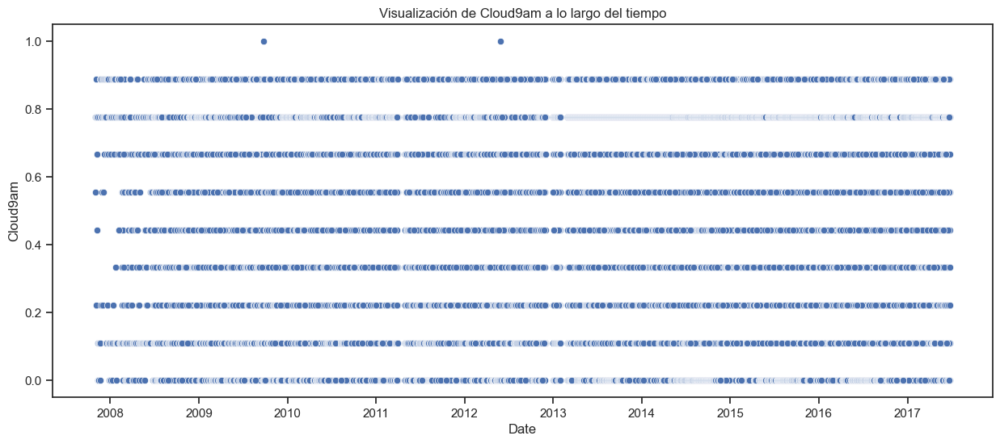

In [29]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Cloud9am'])
plt.title('Visualización de Cloud9am a lo largo del tiempo')
plt.show()

Vemos como tiene dos outliers

##### Cloud3pm

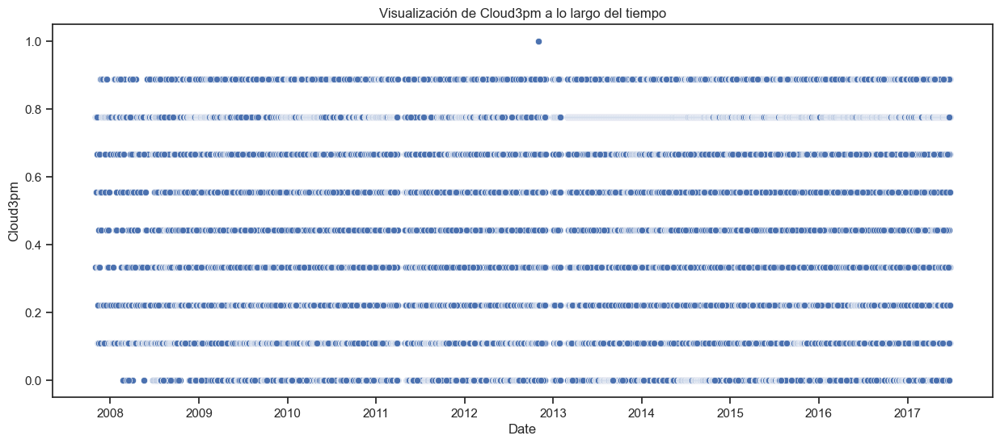

In [30]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Cloud3pm'])
plt.title('Visualización de Cloud3pm a lo largo del tiempo')
plt.show()

Vemos como tiene un outlier

##### Temp9am

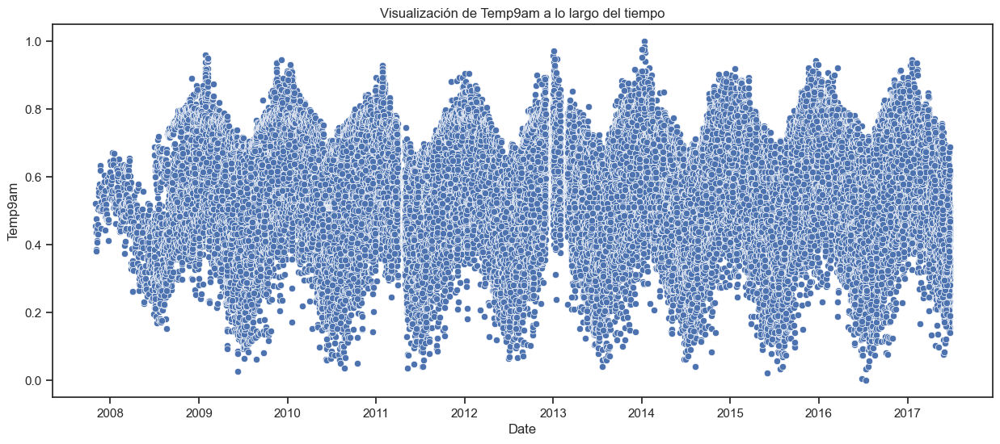

In [31]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Temp9am'])
plt.title('Visualización de Temp9am a lo largo del tiempo')
plt.show()

No tiene outliers

##### Temp3pm

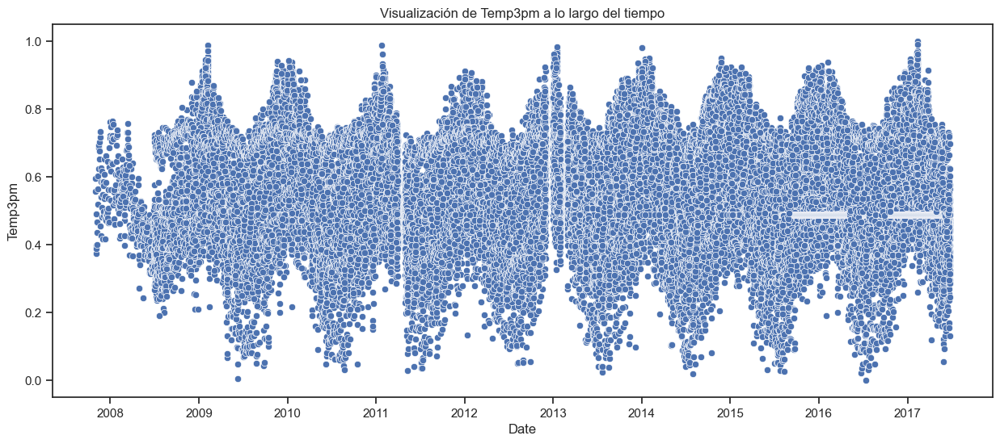

In [32]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x=weather_data['Date'], y=weather_data_normalized['Temp3pm'])
plt.title('Visualización de Temp3pm a lo largo del tiempo')
plt.show()

No tiene outliers

## Eliminación Outliers 

In [33]:
# Define los umbrales para cada columna
umbrales = {'Rainfall': 0.6,
            'Evaporation': 0.8,
            'WindSpeed9am': 0.8,
            'Cloud9am': 0.95,
            'Cloud3pm': 0.95}

# Inicializa una lista vacía para almacenar los índices de filas con valores atípicos
indices_outliers = []

# Copiamos el df weather_data_normalized
weather_data_normalized_no_outliers = weather_data_normalized.copy()

# Itera sobre el diccionario de umbrales
for columna, threshold in umbrales.items():
    # Identifica los valores atípicos en la columna actual
    outliers = weather_data_normalized_no_outliers[columna] > threshold
    # Agrega los índices de las filas con valores atípicos a la lista
    indices_outliers.extend(weather_data_normalized_no_outliers.index[outliers])

# Elimina las filas con valores atípicos
weather_data_normalized_no_outliers = weather_data_normalized_no_outliers.drop(indices_outliers)

## Graficos comparativos Outliers & No Outliers

#### Rainfall

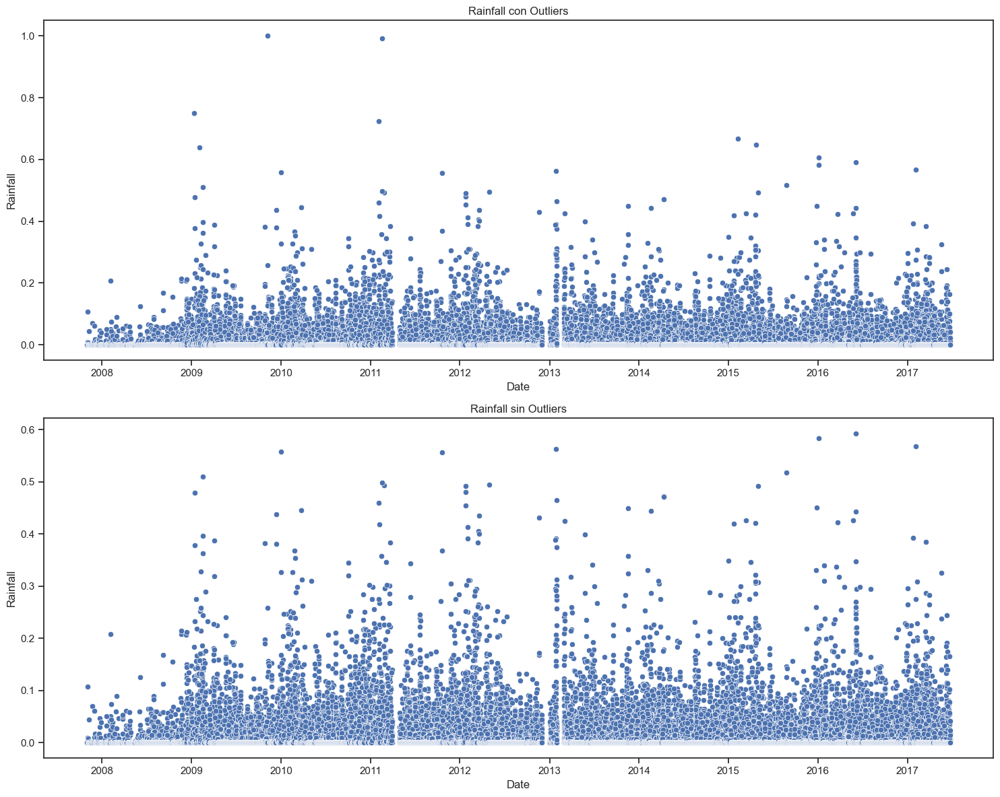

In [34]:
# Crea una figura y dos ejes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Crea el primer gráfico de dispersión en el primer eje
sns.scatterplot(x=weather_data['Date'], y='Rainfall', data=weather_data_normalized, ax=ax1) 
ax1.set_title('Rainfall con Outliers')

# Crea el segundo gráfico de dispersión en el segundo eje
sns.scatterplot(x=weather_data['Date'], y='Rainfall', data=weather_data_normalized_no_outliers, ax=ax2) 
ax2.set_title('Rainfall sin Outliers')

# Muestra los gráficos
plt.tight_layout()
plt.show()

#### Evaporation

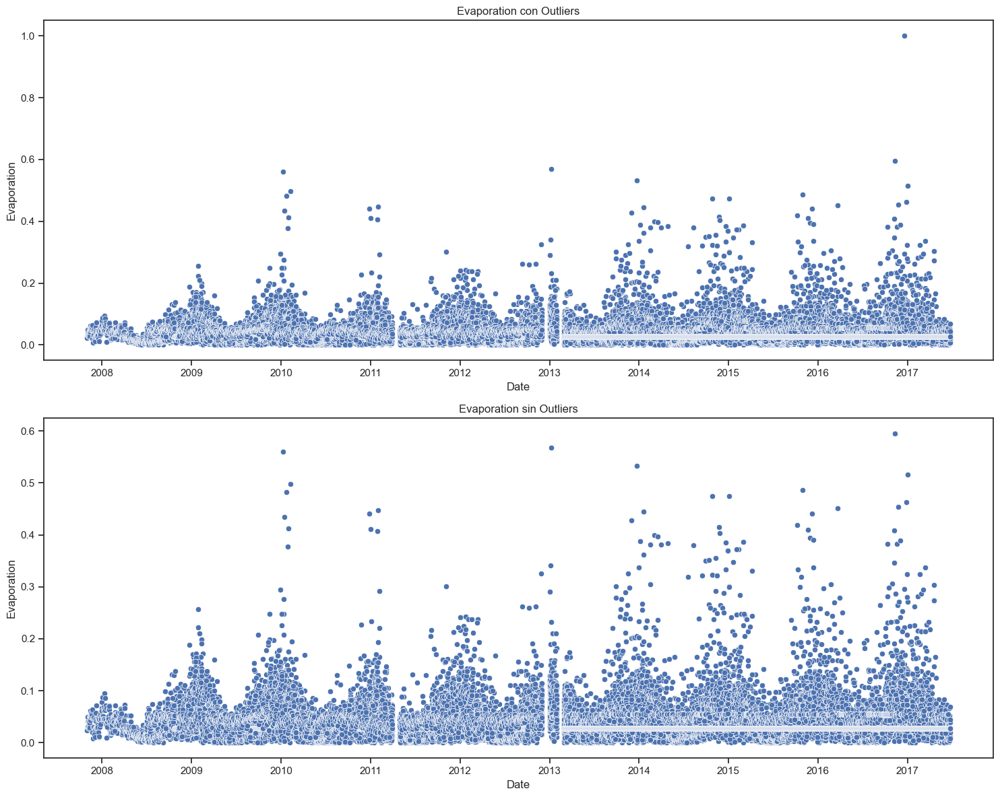

In [35]:
# Crea una figura y dos ejes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Crea el primer gráfico de dispersión en el primer eje
sns.scatterplot(x=weather_data['Date'], y='Evaporation', data=weather_data_normalized, ax=ax1) 
ax1.set_title('Evaporation con Outliers')

# Crea el segundo gráfico de dispersión en el segundo eje
sns.scatterplot(x=weather_data['Date'], y='Evaporation', data=weather_data_normalized_no_outliers, ax=ax2) 
ax2.set_title('Evaporation sin Outliers')

# Muestra los gráficos
plt.tight_layout()
plt.show()

#### WindSpeed9am

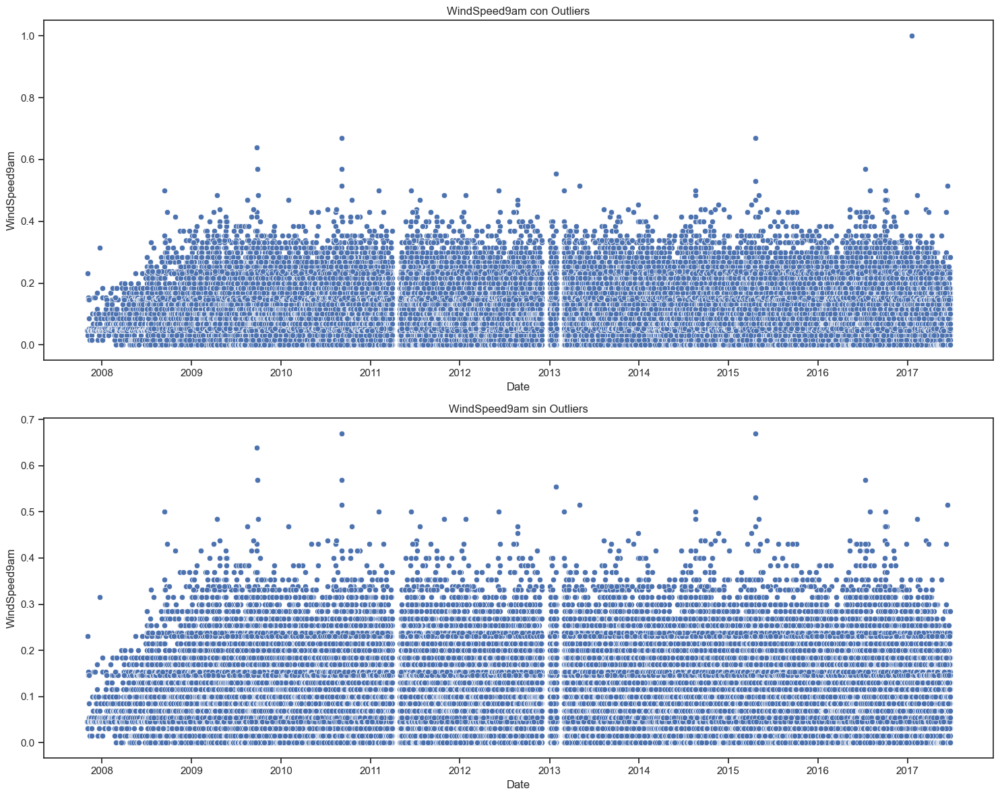

In [36]:
# Crea una figura y dos ejes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Crea el primer gráfico de dispersión en el primer eje
sns.scatterplot(x=weather_data['Date'], y='WindSpeed9am', data=weather_data_normalized, ax=ax1) 
ax1.set_title('WindSpeed9am con Outliers')

# Crea el segundo gráfico de dispersión en el segundo eje
sns.scatterplot(x=weather_data['Date'], y='WindSpeed9am', data=weather_data_normalized_no_outliers, ax=ax2) 
ax2.set_title('WindSpeed9am sin Outliers')

# Muestra los gráficos
plt.tight_layout()
plt.show()

#### Cloud9am

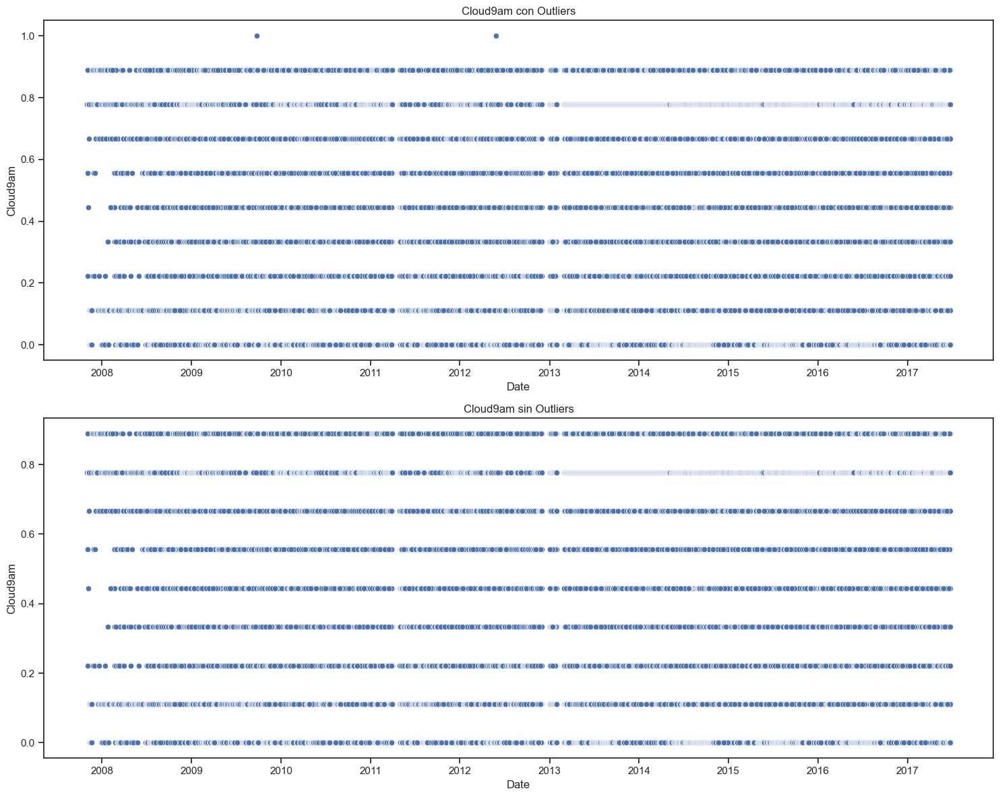

In [37]:
# Crea una figura y dos ejes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Crea el primer gráfico de dispersión en el primer eje
sns.scatterplot(x=weather_data['Date'], y='Cloud9am', data=weather_data_normalized, ax=ax1) 
ax1.set_title('Cloud9am con Outliers')

# Crea el segundo gráfico de dispersión en el segundo eje
sns.scatterplot(x=weather_data['Date'], y='Cloud9am', data=weather_data_normalized_no_outliers, ax=ax2) 
ax2.set_title('Cloud9am sin Outliers')

# Muestra los gráficos
plt.tight_layout()
plt.show()

#### Cloud3pm

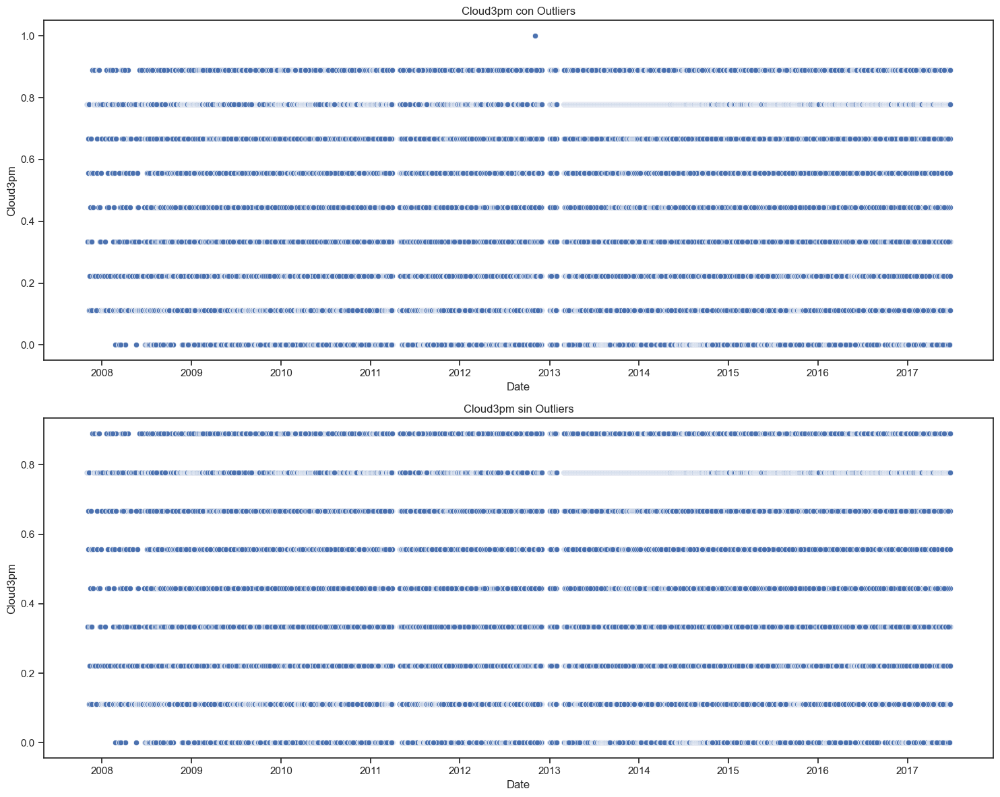

In [38]:
# Crea una figura y dos ejes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Crea el primer gráfico de dispersión en el primer eje
sns.scatterplot(x=weather_data['Date'], y='Cloud3pm', data=weather_data_normalized, ax=ax1) 
ax1.set_title('Cloud3pm con Outliers')

# Crea el segundo gráfico de dispersión en el segundo eje
sns.scatterplot(x=weather_data['Date'], y='Cloud3pm', data=weather_data_normalized_no_outliers, ax=ax2) 
ax2.set_title('Cloud3pm sin Outliers')

# Muestra los gráficos
plt.tight_layout()
plt.show()

# One hot enconding

In [39]:
# Supongamos que 'df' es tu DataFrame original y 'columnas_a_dummies' es una lista de las columnas para las cuales quieres crear variables ficticias
columnas_a_dummies = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

# Inicializa un DataFrame vacío para almacenar las variables ficticias
df_dummies = pd.DataFrame()

# Itera sobre las columnas y crea variables ficticias para cada una de ellas
for columna in columnas_a_dummies:
    dummies = pd.get_dummies(weather_data[columna], prefix=columna)  # Crea variables ficticias para la columna actual
    df_dummies = pd.concat([df_dummies, dummies], axis=1)  # Concatena las variables ficticias al DataFrame de variables ficticias
# Concatena el DataFrame original 'df' con el DataFrame de variables ficticias 'df_dummies'

df_dummies

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes,RainTomorrow_No,RainTomorrow_Yes
0,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,True,False,True,False,True,False
1,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,False,True,False
2,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,False,True,False
3,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
4,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
145408,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
145409,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
145410,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,True,False,True,False


In [40]:
df_dummies = df_dummies.astype('int64')

In [41]:
df_dummies

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes,RainTomorrow_No,RainTomorrow_Yes
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
145408,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
145409,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
145410,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0


In [42]:
df_dummies = pd.concat([weather_data_normalized_no_outliers, df_dummies], axis=1)

In [43]:
df_dummies

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes,RainTomorrow_No,RainTomorrow_Yes
0,0.516509,0.523629,0.001617,0.027586,0.0,0.294574,0.153846,0.275862,0.71,0.22,...,0,0,0,0,1,0,1,0,1,0
1,0.375000,0.565217,0.000000,0.027586,0.0,0.294574,0.030769,0.252874,0.44,0.25,...,0,0,0,0,0,1,1,0,1,0
2,0.504717,0.576560,0.000000,0.027586,0.0,0.310078,0.146154,0.298851,0.38,0.30,...,0,0,0,0,0,1,1,0,1,0
3,0.417453,0.620038,0.000000,0.027586,0.0,0.139535,0.084615,0.103448,0.45,0.16,...,0,0,0,0,0,0,1,0,1,0
4,0.613208,0.701323,0.002695,0.027586,0.0,0.271318,0.053846,0.229885,0.82,0.33,...,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87967,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,1,0,1
89343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,1,0,1
93314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,1,0,1
106899,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,1,0,1,0


# Matriz de correlación

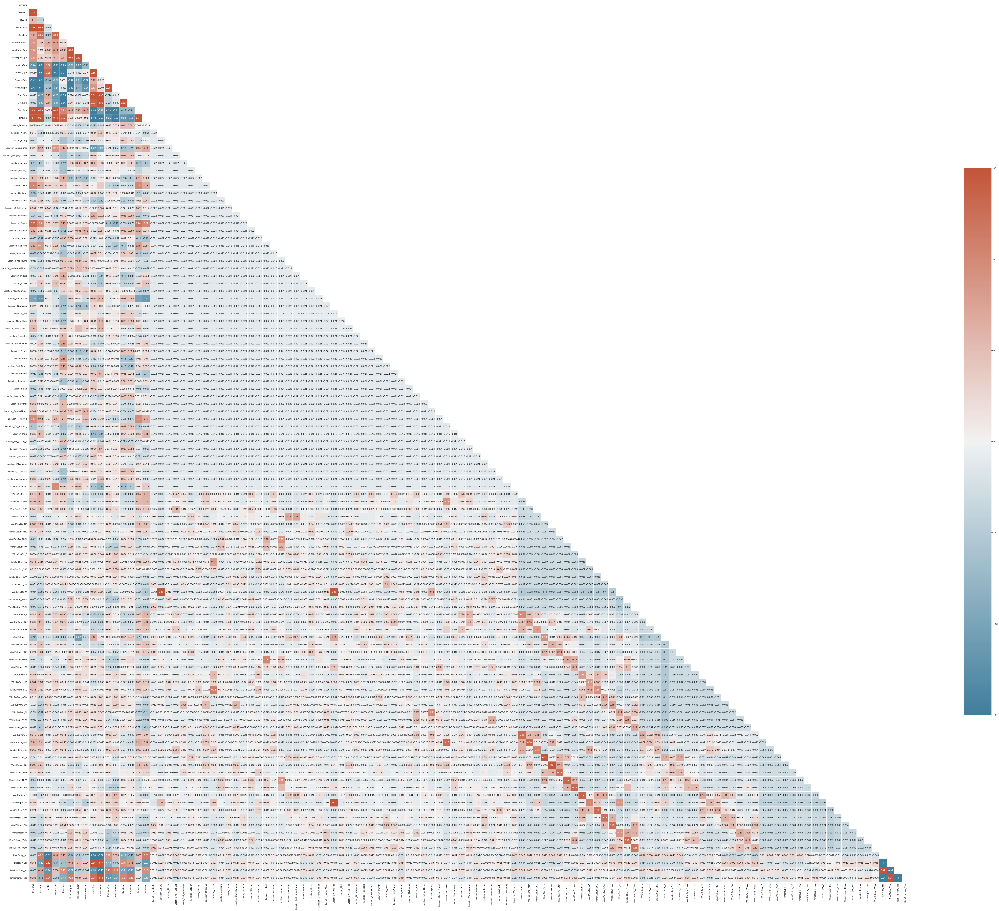

In [44]:
sns.set_theme(style="white")

# Compute the correlation matrix
corr = df_dummies.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(100, 100))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-.3 ,vmax=.3,center=0, square=True,annot=True ,linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

# Matriz de correlación reducida

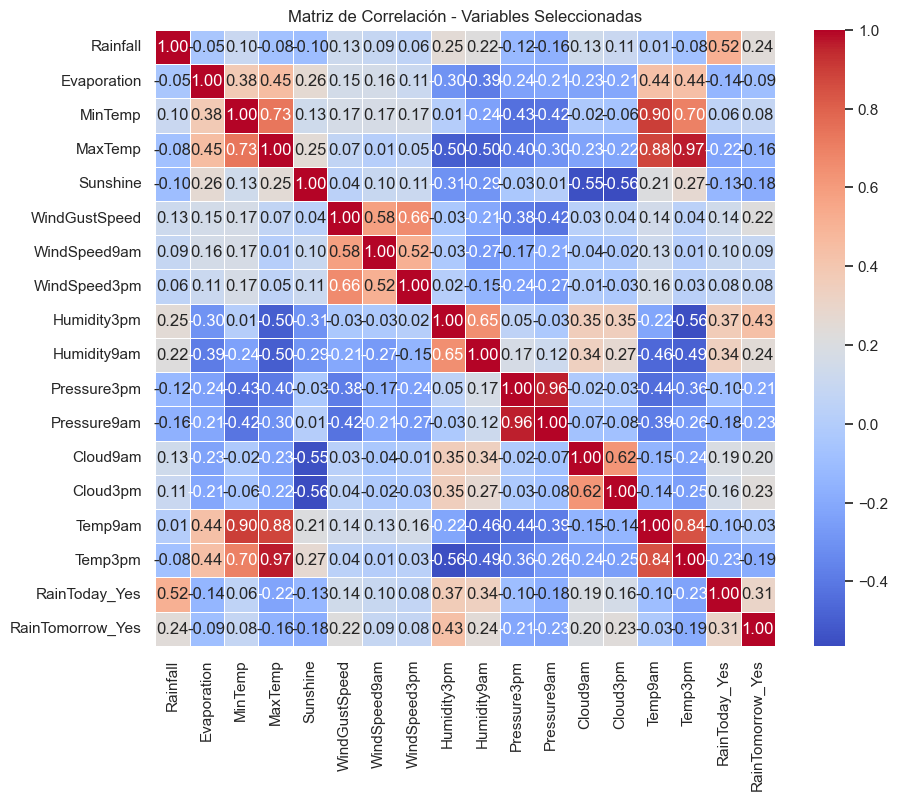

In [53]:
# Select the columns of interest
selected_columns = ['Rainfall','Evaporation', 'MinTemp','MaxTemp', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity3pm','Humidity9am','Pressure3pm','Pressure9am','Cloud9am','Cloud3pm', 'Temp9am','Temp3pm','RainToday_Yes','RainTomorrow_Yes']
df_dummies = df_dummies[selected_columns]

# Calculate the correlation matrix
correlation_matrix = df_dummies.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Set the title of the plot
plt.title('Matriz de Correlación - Variables Seleccionadas')

# Show the plot
plt.show()

In [55]:

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [54]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
modelo = smf.ols('RainTomorrow_Yes ~ Rainfall + Evaporation + MinTemp + MaxTemp + Sunshine + WindGustSpeed + WindSpeed9am + WindSpeed3pm + Humidity3pm + Humidity9am + Pressure3pm + Pressure9am + Cloud9am + Cloud3pm + Temp9am + Temp3pm + RainToday_Yes', df_dummies)
resultado = modelo.fit()
resultado.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       RainTomorrow_Yes   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     3664.
Date:                Thu, 18 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:32:19   Log-Likelihood:                -52050.
No. Observations:              145399   AIC:                         1.041e+05
Df Residuals:                  145381   BIC:                         1.043e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -0.0191      0.014     -1.379      0.168      -0.046       0.008
Rainfall          0.8978      0.049     18.291      0.000       0.802       0.994
Evaporation       0.0632      0.048      1.310      0.190      -0.031       0.158
MinTemp           0.0292      0.017      1.725      0.084      -0.004       0.062
MaxTemp          -0.0615      0.031     -1.984      0.047      -0.122      -0.001
Sunshine         -0.0298      0.004     -8.119      0.000      -0.037      -0.023
WindGustSpeed     0.9786      0.014     70.567      0.000       0.951       1.006
WindSpeed9am     -0.0732      0.018     -4.090      0.000      -0.108      -0.038
WindSpeed3pm     -0.4360      0.013    -34.619      0.000      -0.461      -0.411
Humidity3pm       0.8713      0.010     91.384      0.000       0.853       0.890
Humidity9am      -0.0876      0.008    -10.524      0.000      -0.104      -0.071
Pressure3pm      -1.7172      0.034    -50.559      0.000      -1.784      -1.651
Pressure9am       1.1244      0.033     34.482      0.000       1.060       1.188
Cloud9am         -0.0103      0.004     -2.340      0.019      -0.019      -0.002
Cloud3pm          0.0955      0.005     20.409      0.000       0.086       0.105
Temp9am          -0.2148      0.027     -8.100      0.000      -0.267      -0.163
Temp3pm           0.2061      0.032      6.517      0.000       0.144       0.268
RainToday_Yes     0.1126      0.003     40.217      0.000       0.107       0.118
==============================================================================
Omnibus:                    15047.376   Durbin-Watson:                   1.894
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            20132.125
Skew:                           0.891   Prob(JB):                         0.00
Kurtosis:                       3.380   Cond. No.                         116.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Com calaramente nos e ente hay que hacer que si se enciuetea 

In [47]:
modelo_ajustado = smf.ols('RainTomorrow_Yes ~ MinTemp + MaxTemp + Evaporation', df_dummies)
resultado_ajustado = modelo_ajustado.fit()
resultado_ajustado.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       RainTomorrow_Yes   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                     5946.
Date:                Thu, 18 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:31:52   Log-Likelihood:                -69559.
No. Observations:              145399   AIC:                         1.391e+05
Df Residuals:                  145395   BIC:                         1.392e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.4039      0.004     95.739      0.000       0.396       0.412
MinTemp         1.1824      0.010    117.650      0.000       1.163       1.202
MaxTemp        -1.3834      0.012   -118.289      0.000      -1.406      -1.360
Evaporation    -0.8755      0.052    -16.893      0.000      -0.977      -0.774
==============================================================================
Omnibus:                    20655.438   Durbin-Watson:                   1.585
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            30659.105
Skew:                           1.120   Prob(JB):                         0.00
Kurtosis:                       2.789   Cond. No.                         62.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [48]:
df_dummies.columns

Index(['Rainfall', 'Evaporation', 'MinTemp', 'MaxTemp', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity3pm',
       'Humidity9am', 'Pressure3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes'],
      dtype='object')

In [57]:
plt.scatter(df_dummies['RainTomorrow_Yes'], resultado.predict(df_dummies[['MinTemp']]))
plt.plot([1.1,0], [1.1,0], color = 'red') 
plt.title("Gráfico comparativo entre valores reales y valores predichos")
plt.show()

PatsyError: predict requires that you use a DataFrame when predicting from a model
that was created using the formula api.

The original error message returned by patsy is:
Error evaluating factor: NameError: name 'Rainfall' is not defined
    RainTomorrow_Yes ~ Rainfall + Evaporation + MinTemp + MaxTemp + Sunshine + WindGustSpeed + WindSpeed9am + WindSpeed3pm + Humidity3pm + Humidity9am + Pressure3pm + Pressure9am + Cloud9am + Cloud3pm + Temp9am + Temp3pm + RainToday_Yes
                       ^^^^^^^^

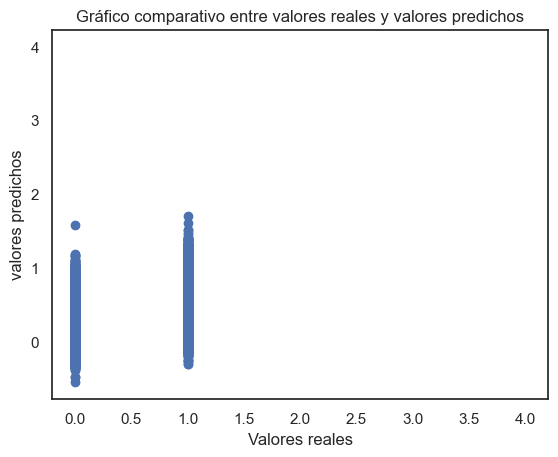

In [50]:
plt.scatter(df_dummies['RainTomorrow_Yes'], resultado.predict(df_dummies[['Rainfall', 'Evaporation', 'MinTemp', 'MaxTemp', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity3pm',
       'Humidity9am', 'Pressure3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday_Yes']]))
plt.plot([4,4], [4,4], color = 'red') 
plt.xlabel('Valores reales')
plt.ylabel('valores predichos')
plt.title("Gráfico comparativo entre valores reales y valores predichos")
plt.show()

# Validación Cruzada K-Folds

In [51]:
from sklearn.model_selection import train_test_split

# Dividir los datos en características (X) y etiquetas (y)
X = df_dummies.drop(['RainTomorrow_Yes'], axis=1)  # Características
y = df_dummies['RainTomorrow_Yes']  # Etiquetas

# Dividir los datos en conjuntos de entrenamiento y prueba (y opcionalmente validación)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Si deseas incluir un conjunto de validación, puedes dividir X_train y y_train nuevamente
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Ahora X_train, X_test, y_train, y_test (y opcionalmente X_val, y_val) contienen tus datos divididos


In [52]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Entrenar el modelo
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Predecir con el conjunto de validación
y_pred_val = model.predict(X_val)

# Calcular la precisión en el conjunto de validación
accuracy_val = accuracy_score(y_val, y_pred_val)
print("Precisión en el conjunto de validación:", accuracy_val)

# Evaluar el modelo con el conjunto de prueba
y_pred_test = model.predict(X_test)
accuracy_test = accuracy_score(y_test, y_pred_test)
print("Precisión en el conjunto de prueba:", accuracy_test)


Precisión en el conjunto de validación: 0.8491902485988378
Precisión en el conjunto de prueba: 0.8518034590654334
